[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/TU-Delft-AI-Energy-Lab/grid-synthesizer/blob/main/examples/colab/rte7k_from_source_file_colab.ipynb)


# RTE 7000 test

In this example, we showcase the synthesization of the newly released [RTE dataset](https://huggingface.co/datasets/OpenSynth/D-GITT-RTE7000-2021), which contains snaps of the French electric grid. Here, we use one snapshot of the powsybl-compitable data source file, located in `./data/future_snapshot.xiidm.bz2`. 

In [1]:
import os
import networkx as nx
from collections import Counter

import pypowsybl as ppl


'opf' extra dependencies are not installed, some features will not be available


## Load the data from source file

In [2]:
grid = ppl.network.load(file='data/future_snapshot.xiidm.bz2')
print('Grid model loaded')

Grid model loaded

In [3]:
nsubstations = len(grid.get_substations())
nvoltage_levels = len(grid.get_voltage_levels())
nbusbars = len(grid.get_busbar_sections())
nlines = len(grid.get_lines())
nbuses = len(grid.get_buses())
ntr = len(grid.get_2_windings_transformers())
nswitches = len(grid.get_switches())
nloads = len(grid.get_loads())
ngens = len(grid.get_generators())

print('Grid statistics:')
print(f'Substations: {nsubstations}, Voltage Levels: {nvoltage_levels}, '
        f'Busbars: {nbusbars}, Buses: {nbuses}, Switches: {nswitches} ,Transformers: {ntr}, Lines: {nlines}, Loads: {nloads},  '
        f'Generators: {ngens}')

Grid statistics:

Substations: 4835, Voltage Levels: 5895, Busbars: 11924, Buses: 6484, Switches: 86083 ,Transformers: 1784, Lines: 7773, Loads: 6915,  Generators: 5658

In [4]:
from powergrid_synth import load_grid


In [5]:
cgmes_dir = os.path.join("data", "future_snapshot.xiidm.bz2")
# load from CGMES via load_grid
graph_ref = load_grid(cgmes_dir)


print(f"Nodes: {graph_ref.number_of_nodes()}")
print(f"Edges: {graph_ref.number_of_edges()}")
print(f"Voltage level map: {graph_ref.graph['base_kv_map']}")

# Bus type breakdown
bus_types = Counter(d["bus_type"] for _, d in graph_ref.nodes(data=True))
print(f"Bus types: {dict(bus_types)}")

Nodes: 6484

Edges: 7725

Voltage level map: {0: 380.0, 1: 225.0, 2: 150.0, 3: 90.0, 4: 63.0, 5: 45.0, 6: 42.0, 7: 20.0}

Bus types: {'Gen': 1290, 'Conn': 2456, 'Load': 2738}

## Synthesization

In [6]:
from powergrid_synth import (
    PowerGridGenerator,
    BusTypeAllocator,
    CapacityAllocator,
    LoadAllocator,
    GenerationDispatcher,
    TransmissionLineAllocator,
    extract_topology_params_from_graph,
    TransmissionGrid,
)

# Extract topology characteristics
params = extract_topology_params_from_graph(graph_ref)

Extracting topology parameters...

In [7]:
# Generate synthetic topology
gen = PowerGridGenerator(seed=42)
graph_syn = gen.generate_grid(
    degrees_by_level=params["degrees_by_level"],
    diameters_by_level=params["diameters_by_level"],
    transformer_degrees=params["transformer_degrees"],
    keep_lcc=True,
)

print(f"Reference:  {graph_ref.number_of_nodes()} nodes, {graph_ref.number_of_edges()} edges")
print(f"Synthetic:  {graph_syn.number_of_nodes()} nodes, {graph_syn.number_of_edges()} edges")

--- Starting Generation for 8 Voltage Levels ---

Generating Level 0...

  -> Level 0 Complete. Nodes: 443, Edges: 441

Generating Level 1...

  -> Level 1 Complete. Nodes: 1575, Edges: 1605

Generating Level 2...

  -> Level 2 Complete. Nodes: 75, Edges: 58

Generating Level 3...

  -> Level 3 Complete. Nodes: 1432, Edges: 1463

Generating Level 4...

  -> Level 4 Complete. Nodes: 3937, Edges: 4114

Generating Level 5...

  -> Level 5 Complete. Nodes: 91, Edges: 82

Generating Level 6...

  -> Level 6 Complete. Nodes: 4, Edges: 0

Generating Level 7...

  -> Level 7 Complete. Nodes: 375, Edges: 20

Generating Transformer Connections...

  -> Connecting Level 0 <-> Level 1

  -> Connecting Level 0 <-> Level 3

  -> Connecting Level 0 <-> Level 4

  -> Connecting Level 0 <-> Level 7

  -> Connecting Level 1 <-> Level 2

  -> Connecting Level 1 <-> Level 3

  -> Connecting Level 1 <-> Level 4

  -> Connecting Level 1 <-> Level 5

  -> Connecting Level 1 <-> Level 6

  -> Connecting Level 1 <-> Level 7

  -> Connecting Level 2 <-> Level 4

  -> Connecting Level 2 <-> Level 5

  -> Connecting Level 2 <-> Level 7

  -> Connecting Level 3 <-> Level 4

  -> Connecting Level 3 <-> Level 7

  -> Connecting Level 4 <-> Level 5

  -> Connecting Level 4 <-> Level 7

  -> Connecting Level 5 <-> Level 7

Filtering for Largest Connected Component (LCC)...

  -> Kept 6252 nodes (removed 1680 isolated nodes)

Reference:  6484 nodes, 7725 edges

Synthetic:  6252 nodes, 8646 edges

In [8]:
# Assign bus types
allocator = BusTypeAllocator(graph_syn)
bus_types = allocator.allocate()
nx.set_node_attributes(graph_syn, bus_types, name="bus_type")

bt_counts = Counter(bus_types.values())
print(f"Bus types: {dict(bt_counts)}")

Starting Bus Type Allocation (N=6252, M=8646)...

  Target Entropy Score (W*): 2.6933, Std Dev: 0.0039

  Iter 0: Best Error = 0.081348

  Iter 10: Best Error = 0.071668

  Iter 20: Best Error = 0.065082

  Iter 30: Best Error = 0.057895

  Iter 40: Best Error = 0.050535

  Iter 50: Best Error = 0.043006

  Iter 60: Best Error = 0.035100

  Iter 70: Best Error = 0.026971

  Iter 80: Best Error = 0.017788

  Iter 90: Best Error = 0.010305

Bus types: {'Load': 2930, 'Conn': 1306, 'Gen': 2016}

In [9]:
# Allocate generation, load, dispatch, and transmission lines
base_kv_map = graph_ref.graph.get("base_kv_map", {0: 110.0})

# The node allocators return dicts; write each result back to the graph,
# since every step reads the attribute written by the previous one.
capacities = CapacityAllocator(graph_syn).allocate()
nx.set_node_attributes(graph_syn, capacities, name="pg_max")

loads = LoadAllocator(graph_syn).allocate(loading_level="H")
nx.set_node_attributes(graph_syn, loads, name="pl")

dispatch = GenerationDispatcher(graph_syn).dispatch()
nx.set_node_attributes(graph_syn, dispatch, name="pg")

# Writes r, x and capacity to the edges directly
TransmissionLineAllocator(graph_syn).allocate()

print(f"Total capacity: {sum(capacities.values()):.2f} MW")
print(f"Total load:     {sum(loads.values()):.2f} MW")
print(f"Total dispatch: {sum(dispatch.values()):.2f} MW")

print("Full synthesis pipeline complete ✓")
print(f"Synthetic grid: {graph_syn.number_of_nodes()} nodes, {graph_syn.number_of_edges()} edges")

Allocating Capacity for 2016 generators.

Total System Capacity Target: 284282.07 MW using Reference System 1

Allocating Loads for 2930 load buses.

Total System Load Target: 200316.61 MW (Level: H)

Total capacity: 284282.07 MW

Total load:     200316.61 MW

Total dispatch: 200316.61 MW

Full synthesis pipeline complete ✓

Synthetic grid: 6252 nodes, 8646 edges

In [10]:
from powergrid_synth import GraphComparator, GridVisualizer

comparator = GraphComparator(graph_syn, graph_ref)

# Compare degree distributions per voltage level
df = comparator.compare_degree_distributions()
df

DEGREE DISTRIBUTION COMPARISON  (KS & Relative Hausdorff)

  Level KS Statistic RH Distance
Level 0       0.1440      0.1000
Level 1       0.0962      0.0833
Level 2       0.1153      0.3333
Level 3       0.1213      0.1667
Level 4       0.1325      0.1538
Level 5       0.3282      0.4545
Level 6       1.0000      1.0000
Level 7       0.0245      0.6667

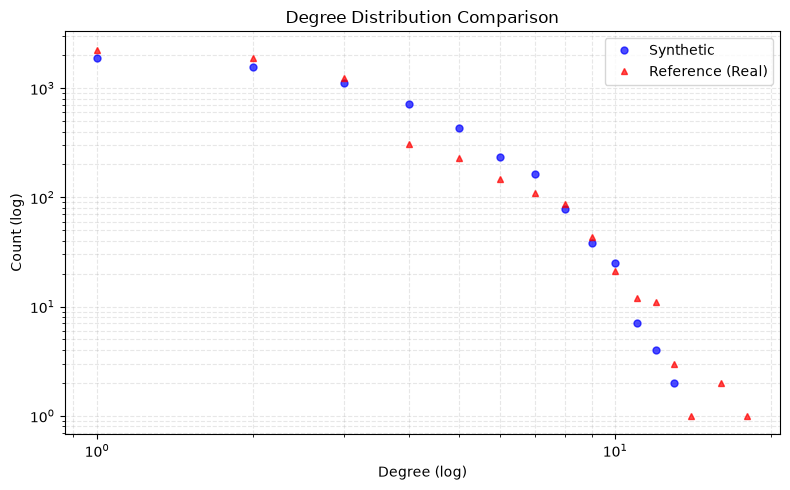

In [11]:
# Degree distribution comparison
comparator.plot_degree_comparison(log_scale=True)

## Run some power flows using pandapower or powsybl

In [12]:
from powergrid_synth import pandapower_to_pypowsybl, nx_to_pandapower
import pandapower as pp

base_kv_list = graph_ref.graph.get("base_kv_map", {0: 110.0})
# Convert synthetic transmission grid to pandapower
net_syn_pp = nx_to_pandapower(graph_syn, base_kv_map=base_kv_list)
print(f"pandapower network: {len(net_syn_pp.bus)} buses, {len(net_syn_pp.line)} lines, "
      f"{len(net_syn_pp.trafo)} trafos")

# Run DC power flow via pandapower
try:
    pp.rundcpp(net_syn_pp)
    print(f"\nDC power flow converged ✓")
    print(f"  Max bus voltage angle: {net_syn_pp.res_bus.va_degree.max():.2f}°")
    print(f"  Min bus voltage angle: {net_syn_pp.res_bus.va_degree.min():.2f}°")
except Exception as e:
    print(f"DC power flow failed: {e}")

pandapower network: 6252 buses, 7645 lines, 1001 trafos


DC power flow converged ✓

  Max bus voltage angle: 187.66°

  Min bus voltage angle: -89.75°

## Run AC using pypowsybl

In [13]:
ppl_net = pandapower_to_pypowsybl(net_syn_pp)
ppl.loadflow.run_ac(ppl_net)

[ComponentResult(connected_component_num=0, synchronous_component_num=0, status=MAX_ITERATION_REACHED, status_text=Reached Newton-Raphson max iterations limit, iteration_count=16, reference_bus_id='sub_4_1285', slack_bus_results=[SlackBusResult(id='sub_4_1285', active_power_mismatch=-3272279.7235124744)], distributed_active_power=0.0)]

In [14]:
from pypowsybl_jupyter import network_explorer, nad_explorer, display_nad

In [15]:
# nad_explorer(ppl_net, depth=3)

In [16]:
ppl_net.get_network_area_diagram()

In [17]:
grid.get_network_area_diagram()